In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Importing Liabraries

In [ ]:
!pip install tensorflow opencv-python matplotlib scikit-learn

## Data Collection

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd

# Initialize lists to hold the images and labels
images = []
labels = []

In [ ]:
import os
import cv2
import numpy as np

In [ ]:
import os
import cv2
import numpy as np

# Define your paths
original_images_path = '/content/drive/MyDrive/Building_Defects/Combined_Equally_Images'
categories = [ 'Overweld', 'Porosity','Undercut', 'Underfilled']
label_map = {0: 'Overweld', 1: 'Porosity', 2: 'Undercut', 3: 'Underfilled'}

# Initialize lists to hold the original and augmented images and labels
original_images = []
original_labels = []

# Load original images and labels
for category in categories:
    category_path = os.path.join(original_images_path, category)
    label = list(label_map.keys())[list(label_map.values()).index(category)]

    for img_name in os.listdir(category_path):
        img_path = os.path.join(category_path, img_name)
        img = cv2.imread(img_path)
        if img is not None:
            img = cv2.resize(img, (224, 224))  # Resize to match model input
            original_images.append(img)
            original_labels.append(label)

# Convert to numpy arrays
combined_images = np.array(original_images)
combined_labels = np.array(original_labels)

# Print combined dataset size
print(f"Combined dataset size: {len(combined_images)} images")
print(f"Combined labels size: {len(combined_labels)} labels")

Combined dataset size: 896 images
Combined labels size: 896 labels


In [ ]:
# Convert to numpy arrays
image = np.array(combined_images)
label = np.array(combined_labels)

# Create a DataFrame for easy manipulation
data = pd.DataFrame({'image': list(image), 'label': label})

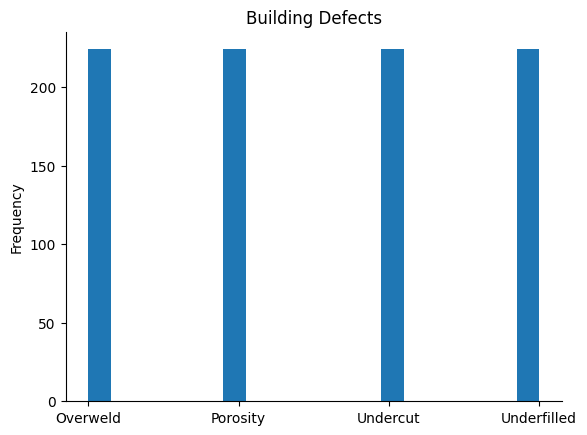

In [ ]:
from matplotlib import pyplot as plt
categories = ['Overweld', 'Porosity', 'Undercut', 'Underfilled']
label_map = {0: 'Overweld', 1: 'Porosity', 2: 'Undercut', 3: 'Underfilled'}

# Plot the histogram
data['label'].plot(kind='hist', bins=20,title='Building Defects')
plt.gca().spines[['top', 'right']].set_visible(False)

# Set the x-axis tick labels to category names
plt.xticks(ticks=range(len(categories)), labels=categories)

# Show the plot
plt.show()

In [ ]:
# Count occurrences of each label
label_counts = data['label'].value_counts()
print(label_counts)
print("------------------")
print(label_map)

label
0    224
1    224
2    224
3    224
Name: count, dtype: int64
------------------
{0: 'Overweld', 1: 'Porosity', 2: 'Undercut', 3: 'Underfilled'}


In [ ]:
combined_images.shape

(896, 224, 224, 3)

In [ ]:
combined_labels.shape

(896,)

In [ ]:
print(len(combined_images), len(combined_labels))

896 896


## Data Analysis

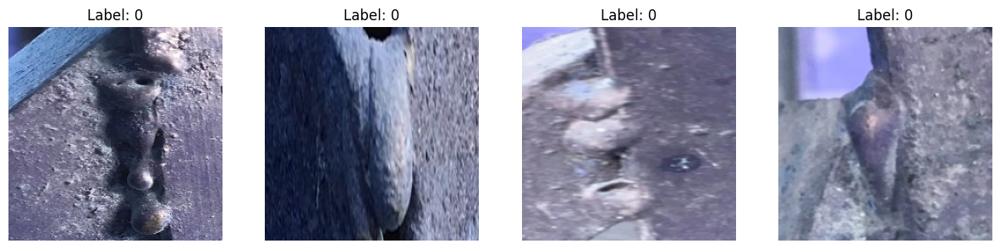

In [ ]:
import matplotlib.pyplot as plt

# Function to display images
def display_images(images, labels, num_images=5):
    plt.figure(figsize=(15, 10))
    for i in range(num_images):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(images[i].astype('uint8'))  # Convert to uint8 for display
        plt.title(f"Label: {labels[i]}")
        plt.axis('off')
    plt.show()

# Display sample images from the combined dataset
display_images(combined_images, combined_labels, num_images=4)

In [ ]:
combined_labels

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

## Split the Data

In [ ]:
from sklearn.model_selection import train_test_split

# Split combined dataset into training (70%), validation (20%), and test (10%)
X_train_val, X_test, y_train_val, y_test = train_test_split(combined_images, combined_labels, test_size=0.1, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.2, random_state=42)

# Print sizes of the splits
print(f"Training dataset size: {len(X_train)} images")
print(f"Validation dataset size: {len(X_val)} images")
print(f"Test dataset size: {len(X_test)} images")

Training dataset size: 644 images
Validation dataset size: 162 images
Test dataset size: 90 images


In [ ]:
print(f"Train/Val size: {len(X_train_val)}, Test size: {len(X_test)}")
print(f"Train size: {len(X_train)}, Val size: {len(X_val)}")

Train/Val size: 806, Test size: 90
Train size: 644, Val size: 162


In [ ]:
print(X_train[0])

[[[132 114 127]
  [139 121 134]
  [147 129 142]
  ...
  [136 102 108]
  [115  81  87]
  [100  66  72]]

 [[133 115 128]
  [135 117 130]
  [137 119 132]
  ...
  [127  93  99]
  [ 95  61  67]
  [ 97  63  69]]

 [[145 127 140]
  [141 123 136]
  [135 117 130]
  ...
  [113  79  85]
  [ 85  51  57]
  [107  73  79]]

 ...

 [[ 96  74  76]
  [116  94  96]
  [126 104 106]
  ...
  [ 81  37  44]
  [ 85  41  48]
  [ 89  45  52]]

 [[104  82  84]
  [124 102 104]
  [118  96  98]
  ...
  [ 78  34  41]
  [ 81  37  44]
  [ 85  41  48]]

 [[111  89  91]
  [128 106 108]
  [110  88  90]
  ...
  [ 77  33  40]
  [ 80  36  43]
  [ 84  40  47]]]


## Data Preprocessing

In [ ]:
# Normalize images
X_train = X_train.astype('float32') / 255.0
X_val = X_val.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0


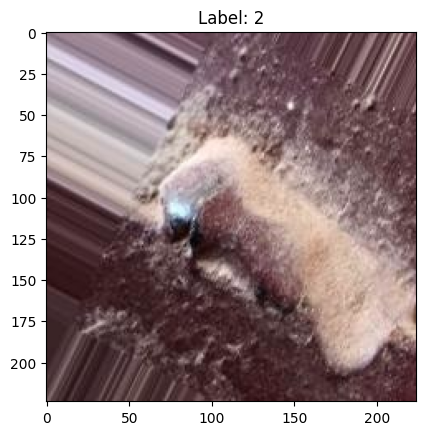

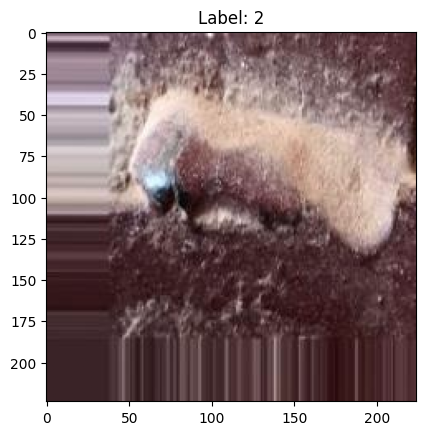

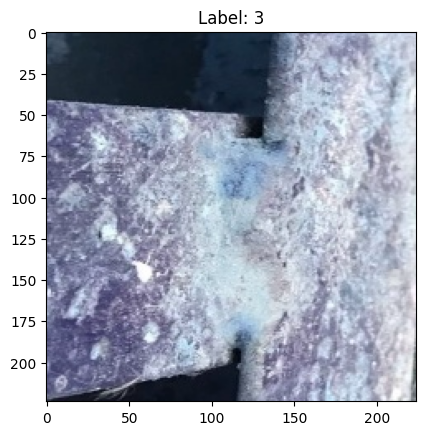

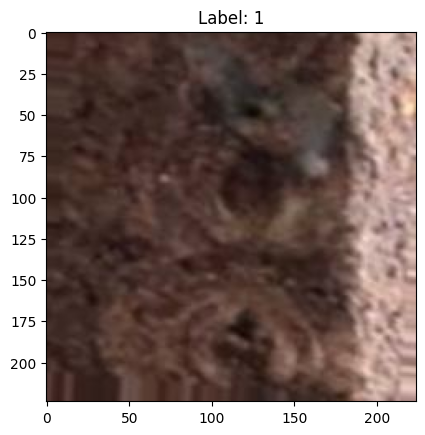

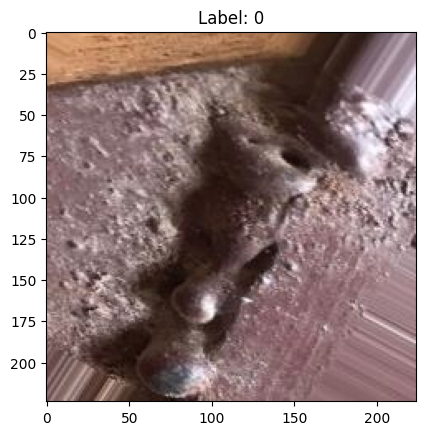

In [ ]:
import matplotlib.pyplot as plt

# Display a few training images
for i in range(5):
    plt.imshow(X_train[i])
    plt.title(f"Label: {y_train[i]}")
    plt.show()

## Model Training

## VGG 16

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical
import tensorflow as tf

In [ ]:
# One-hot encode the labels
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
y_train = to_categorical(y_train, num_classes=4)
y_val = to_categorical(y_val, num_classes=4)
y_test = to_categorical(y_test, num_classes=4)


In [ ]:
# Load the VGG16 model without the top layer
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the convolutional base to use pre-trained features
for layer in base_model.layers:
    layer.trainable = False


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [ ]:
# Add new layers for your task
x = base_model.output
x = Flatten()(x)
x = Dense(256, activation='relu')(x)  # Fully connected layer
x = Dropout(0.4)(x)  # Dropout for regularization
predictions = Dense(4, activation='softmax')(x)  # 4 categories for defects

# Define the complete model
vgg_model = Model(inputs=base_model.input, outputs=predictions)


In [ ]:
vgg_model.compile(optimizer= tf.keras.optimizers.Adam(1e-5),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

# Display the model architecture
vgg_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │       6,422,784 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 21,138,500 (80.64 MB)

 Trainable params: 6,423,812 (24.50 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model
history = vgg_model.fit(X_train, y_train,
                        validation_data=(X_val, y_val),
                        epochs=40,
                        batch_size=32,
                        callbacks=[early_stopping])


Epoch 1/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 29s 606ms/step - accuracy: 0.2935 - loss: 1.5257 - val_accuracy: 0.6543 - val_loss: 1.1239
Epoch 2/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - accuracy: 0.5495 - loss: 1.0964 - val_accuracy: 0.8457 - val_loss: 0.8966
Epoch 3/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - accuracy: 0.7871 - loss: 0.8392 - val_accuracy: 0.8580 - val_loss: 0.7317
Epoch 4/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 6s 207ms/step - accuracy: 0.8502 - loss: 0.6737 - val_accuracy: 0.8765 - val_loss: 0.6184
Epoch 5/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - accuracy: 0.8743 - loss: 0.5313 - val_accuracy: 0.8704 - val_loss: 0.5387
Epoch 6/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - accuracy: 0.8838 - loss: 0.4697 - val_accuracy: 0.8951 - val_loss: 0.4834
Epoch 7/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - accuracy: 0.9056 - loss: 0.4148 - val_accuracy: 0.8951 - val_loss: 0.4416
Epoch 8/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - accuracy: 0.9315 - loss: 0.3501 - val_accuracy: 

In [ ]:
# Save the model after training
vgg_model.save('vgg_defect_classifier.h5')

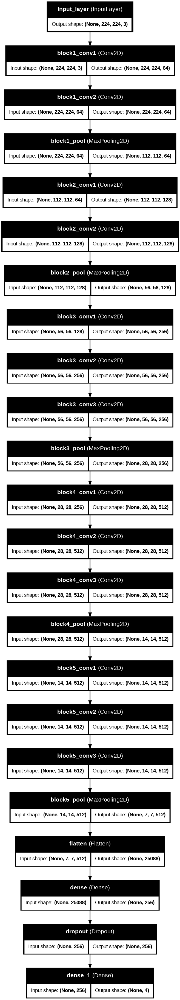

In [ ]:
from tensorflow.keras.utils import plot_model
# Generate a plot of the model architecture
plot_model(
    vgg_model,
    to_file='model_architecture.png',  # Save the plot to a file
    show_shapes=True,                  # Display the shape of the layers
    show_layer_names=True,             # Display layer names
    dpi=96                             # Set the resolution of the image
)

### Accuracy

In [ ]:
# Evaluate the model on the test set
test_loss, test_acc = vgg_model.evaluate(X_test, y_test)
print(f"Test accuracy: {test_acc}")

3/3 ━━━━━━━━━━━━━━━━━━━━ 14s 7s/step - accuracy: 0.9560 - loss: 0.0944
Test accuracy: 0.9666666388511658


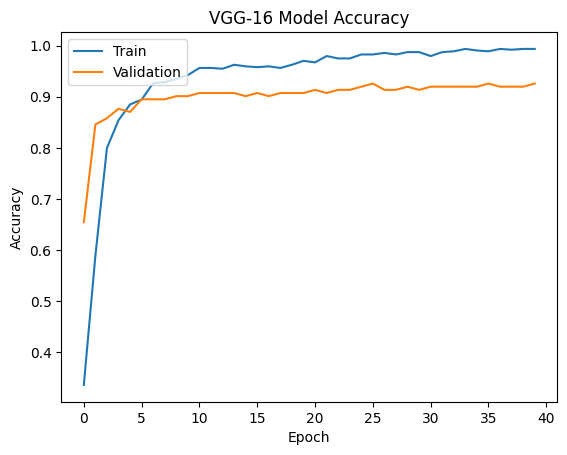

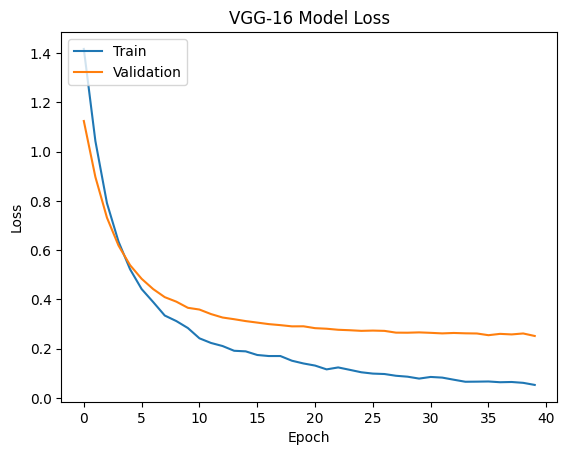

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('VGG-16 Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('VGG-16 Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
# Make predictions on the test set
predictions = vgg_model.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 328ms/step


Confusion Matrix:
[[25  0  0  0]
 [ 0 27  0  0]
 [ 1  0 17  1]
 [ 1  0  0 18]]


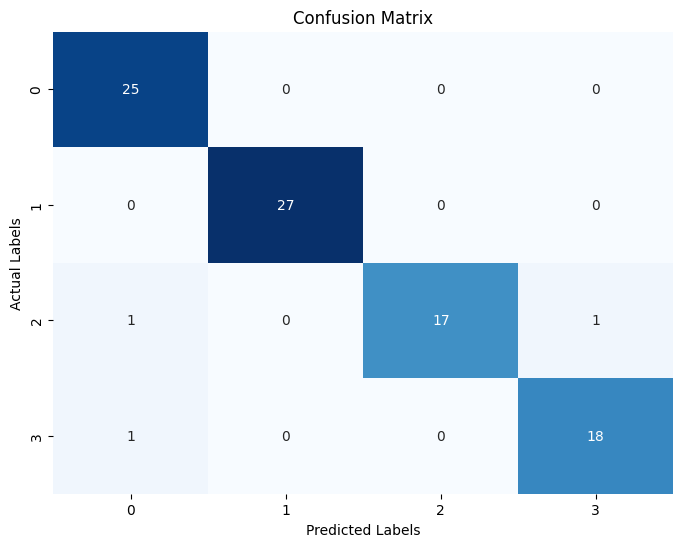

In [ ]:
import tensorflow as tf
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Convert predictions to class indices (argmax to get the predicted class)
predicted_labels = np.argmax(predictions, axis=1)

# 2. Convert y_test (one-hot encoded) to class indices
y_test_labels = np.argmax(y_test, axis=1)

# 3. Calculate the confusion matrix
confusion_matrix1 = tf.math.confusion_matrix(y_test_labels, predicted_labels)

# 4. Convert to numpy for easier handling
confusion_matrix1 = confusion_matrix1.numpy()

# Print the confusion matrix as a raw tensor
print("Confusion Matrix:")
print(confusion_matrix1)
# Optionally, visualize the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix1, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.ylabel("Actual Labels")
plt.xlabel("Predicted Labels")
plt.show()


In [ ]:
from sklearn.metrics import classification_report

# Evaluate the model on the test set
test_loss, test_acc = vgg_model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_acc:.2f}")

# Predict class labels
y_pred = np.argmax(vgg_model.predict(X_test), axis=1)
y_true = np.argmax(y_test, axis=1)  # Assuming y_test is one-hot encoded

# Classification report
from sklearn.metrics import classification_report
report = classification_report(y_true, y_pred, target_names=categories)  # Replace 'class_names' with your class labels
print("Classification Report:")
print(report)


Test Accuracy: 0.97
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
Classification Report:
              precision    recall  f1-score   support

    Overweld       0.93      1.00      0.96        25
    Porosity       1.00      1.00      1.00        27
    Undercut       1.00      0.89      0.94        19
 Underfilled       0.95      0.95      0.95        19

    accuracy                           0.97        90
   macro avg       0.97      0.96      0.96        90
weighted avg       0.97      0.97      0.97        90



In [ ]:

# Predict class labels
y_pred = np.argmax(vgg_model.predict(X_test), axis=1)
y_true = np.argmax(y_test, axis=1)  # Assuming y_test is one-hot encoded

# Calculate precision, recall, and F1-score
from sklearn.metrics import precision_score, recall_score, f1_score

precision = precision_score(y_true, y_pred, average='weighted')
recall = recall_score(y_true, y_pred, average='weighted')
f1 = f1_score(y_true, y_pred, average='weighted')

print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1:.2f}")

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
Precision: 0.97
Recall: 0.97
F1-Score: 0.97


### Prediction

In [ ]:
import matplotlib.pyplot as plt

# Function to plot the images with their predicted labels
def plot_predictions(images, true_labels, predicted_labels, categories, num_images=5):
    plt.figure(figsize=(15, 10))
    for i in range(num_images):
        plt.subplot(2, 5, i + 1)
        plt.imshow(images[i])
        plt.axis('off')
        plt.title(f"True: {categories[np.argmax(true_labels[i])]}, Pred: {categories[predicted_labels[i]]}")
    plt.tight_layout()
    plt.show()

In [ ]:
# Define the categories
categories = ['Overweld', 'Undercut', 'Underfilled', 'Porosity']

#0: Overweld',1:  'Undercut', 2: 'Underfilled', 3: 'Porosity'#
# Convert predictions to class labels
predicted_labels = np.argmax(predictions, axis=1)

# Map predicted labels to category names
predicted_categories = [categories[label] for label in predicted_labels]

# Print the predicted categories
print("Predicted categories:", predicted_categories)

Predicted categories: ['Overweld', 'Undercut', 'Underfilled', 'Porosity', 'Overweld', 'Undercut', 'Undercut', 'Undercut', 'Overweld', 'Overweld', 'Overweld', 'Porosity', 'Porosity', 'Undercut', 'Undercut', 'Porosity', 'Underfilled', 'Underfilled', 'Porosity', 'Overweld', 'Undercut', 'Underfilled', 'Overweld', 'Underfilled', 'Underfilled', 'Underfilled', 'Overweld', 'Porosity', 'Overweld', 'Undercut', 'Underfilled', 'Overweld', 'Porosity', 'Undercut', 'Overweld', 'Underfilled', 'Overweld', 'Overweld', 'Porosity', 'Porosity', 'Overweld', 'Underfilled', 'Underfilled', 'Porosity', 'Undercut', 'Overweld', 'Overweld', 'Undercut', 'Overweld', 'Porosity', 'Overweld', 'Porosity', 'Undercut', 'Porosity', 'Undercut', 'Underfilled', 'Overweld', 'Undercut', 'Overweld', 'Overweld', 'Undercut', 'Undercut', 'Undercut', 'Overweld', 'Overweld', 'Porosity', 'Overweld', 'Undercut', 'Underfilled', 'Underfilled', 'Undercut', 'Undercut', 'Undercut', 'Porosity', 'Porosity', 'Underfilled', 'Porosity', 'Porosit

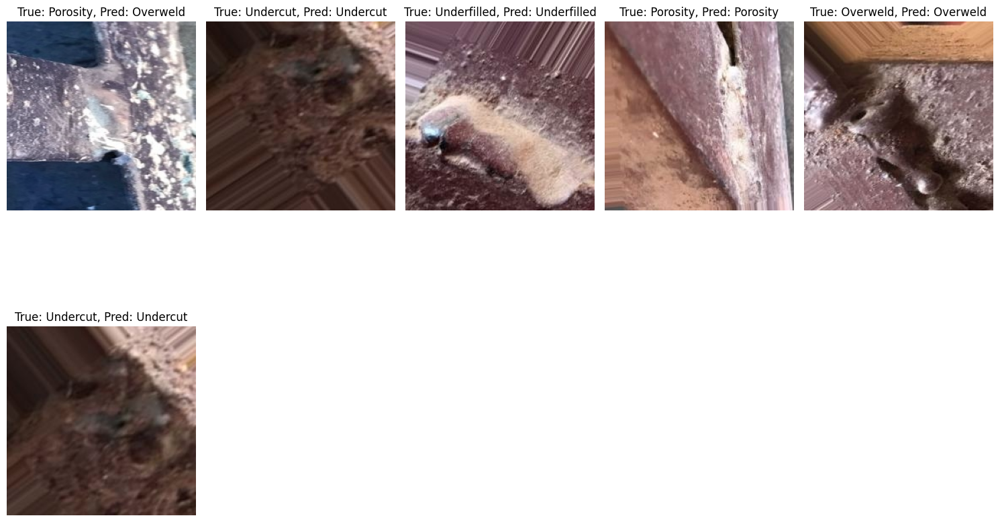

In [ ]:
plot_predictions(X_test, y_test, predicted_labels, categories, num_images=6)

## DenseNet121

In [ ]:
from tensorflow.keras.applications import DenseNet121  # You can use DenseNet169, DenseNet201, etc.
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import to_categorical
import tensorflow as tf
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping

In [ ]:
# Load the pre-trained DenseNet121 model without the top layer
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model layers to retain pre-trained features
for layer in base_model.layers:
    layer.trainable = False

# Add custom layers for your classification task
x = base_model.output
x = GlobalAveragePooling2D()(x)  # Global pooling to reduce dimensions
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5) (x)
predictions = Dense(len(categories), activation='softmax')(x)

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:

# Create the final model
densenet_model = Model(inputs=base_model.input, outputs=predictions)

In [ ]:
# Compile the model
densenet_model.compile(optimizer=Adam(learning_rate=1e-4), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the custom layers
history = densenet_model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=40, batch_size=32)

Epoch 1/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 75s 2s/step - accuracy: 0.4155 - loss: 1.3187 - val_accuracy: 0.8580 - val_loss: 0.5351
Epoch 2/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 31s 102ms/step - accuracy: 0.8624 - loss: 0.4952 - val_accuracy: 0.8889 - val_loss: 0.3350
Epoch 3/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 113ms/step - accuracy: 0.9168 - loss: 0.3139 - val_accuracy: 0.9074 - val_loss: 0.2917
Epoch 4/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - accuracy: 0.9191 - loss: 0.2663 - val_accuracy: 0.9074 - val_loss: 0.2655
Epoch 5/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 96ms/step - accuracy: 0.9281 - loss: 0.2330 - val_accuracy: 0.9136 - val_loss: 0.2528
Epoch 6/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.9379 - loss: 0.1707 - val_accuracy: 0.9136 - val_loss: 0.2445
Epoch 7/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 109ms/step - accuracy: 0.9463 - loss: 0.1661 - val_accuracy: 0.9259 - val_loss: 0.2405
Epoch 8/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 116ms/step - accuracy: 0.9645 - loss: 0.1389 - val_accuracy: 0.92

In [ ]:
# Evaluate on the test set
test_loss, test_acc = densenet_model.evaluate(X_test, y_test)
print(f"Test accuracy after fine-tuning: {test_acc}")

3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 5s/step - accuracy: 0.9905 - loss: 0.0256
Test accuracy after fine-tuning: 0.9888888597488403


In [ ]:
# Display model summary
densenet_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d            │ (None, 230, 230, 3)    │              0 │ input_layer_1[0][0]    │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_1          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_1[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├──────────────────────

 Total params: 10,198,606 (38.90 MB)

 Trainable params: 1,053,700 (4.02 MB)

 Non-trainable params: 7,037,504 (26.85 MB)

 Optimizer params: 2,107,402 (8.04 MB)

### Accuracy

In [ ]:
# Save the model after training
densenet_model.save('densenet_defect_classifier.h5')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.475415 to fit



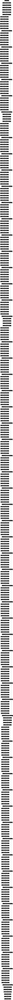

In [ ]:
plot_model(
    densenet_model,
    to_file='densemodel_architecture.png',  # Save the plot to a file
    show_shapes=True,                  # Display the shape of the layers
    show_layer_names=True,             # Display layer names
    dpi=96                             # Set the resolution of the image
)

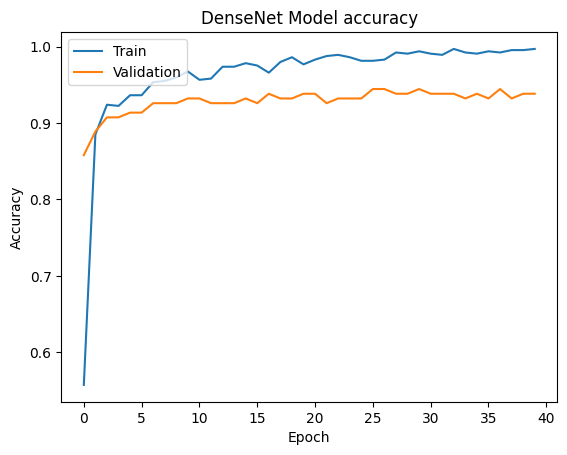

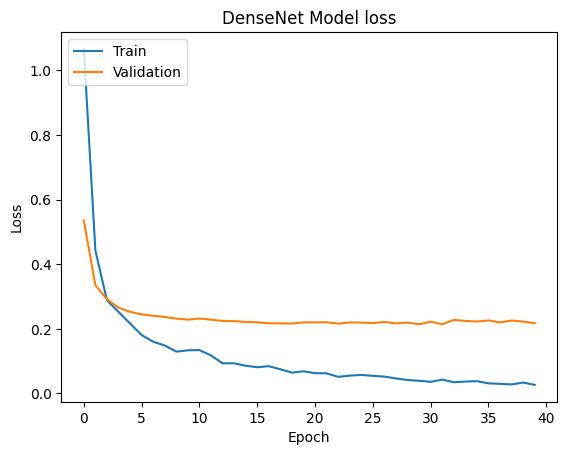

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('DenseNet Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('DenseNet Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [ ]:
# Make predictions on the test set
predictions = densenet_model.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 5s/step


Confusion Matrix:
[[25  0  0  0]
 [ 0 27  0  0]
 [ 1  0 18  0]
 [ 0  0  0 19]]


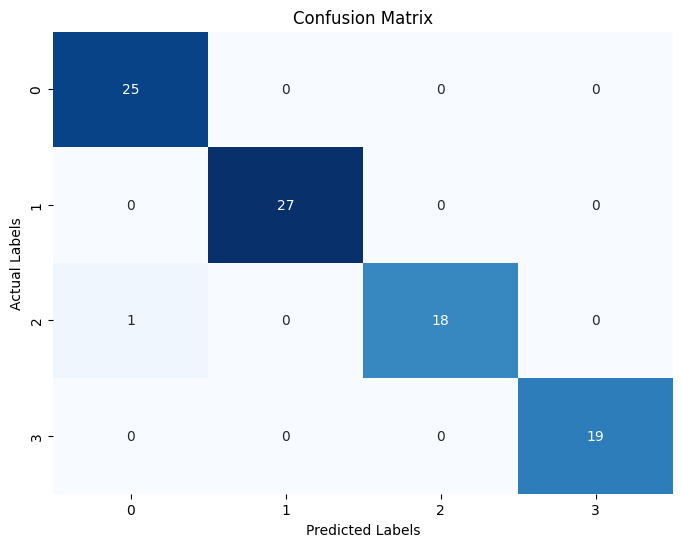

In [ ]:

# 1. Convert predictions to class indices (argmax to get the predicted class)
predicted_labels = np.argmax(predictions, axis=1)

# 2. Convert y_test (one-hot encoded) to class indices
y_test_labels = np.argmax(y_test, axis=1)

# 3. Calculate the confusion matrix
confusion_matrix2 = tf.math.confusion_matrix(y_test_labels, predicted_labels)

# 4. Convert to numpy for easier handling
confusion_matrix2= confusion_matrix2.numpy()

# Print the confusion matrix as a raw tensor
print("Confusion Matrix:")
print(confusion_matrix2)
# Optionally, visualize the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix2, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.ylabel("Actual Labels")
plt.xlabel("Predicted Labels")
plt.show()

In [ ]:
# Predict class labels
y_pred = np.argmax(densenet_model.predict(X_test), axis=1)
y_true = np.argmax(y_test, axis=1)  # Assuming y_test is one-hot encoded

# Classification report
from sklearn.metrics import classification_report
report = classification_report(y_true, y_pred, target_names=categories)  # Replace 'class_names' with your class labels
print("Classification Report:")
print(report)

In [ ]:
# Define the categories
categories = ['Overweld', 'Undercut', 'Underfilled', 'Porosity']

# Convert predictions to class labels
predicted_labels = np.argmax(predictions, axis=1)

# Map predicted labels to category names
predicted_categories = [categories[label] for label in predicted_labels]

# Print the predicted categories
print("Predicted categories:", predicted_categories)

Predicted categories: ['Porosity', 'Undercut', 'Underfilled', 'Porosity', 'Overweld', 'Undercut', 'Undercut', 'Undercut', 'Overweld', 'Overweld', 'Overweld', 'Porosity', 'Underfilled', 'Undercut', 'Undercut', 'Porosity', 'Underfilled', 'Underfilled', 'Porosity', 'Overweld', 'Undercut', 'Underfilled', 'Overweld', 'Underfilled', 'Underfilled', 'Underfilled', 'Overweld', 'Porosity', 'Overweld', 'Undercut', 'Underfilled', 'Overweld', 'Porosity', 'Undercut', 'Overweld', 'Underfilled', 'Overweld', 'Overweld', 'Porosity', 'Porosity', 'Overweld', 'Underfilled', 'Underfilled', 'Porosity', 'Undercut', 'Overweld', 'Overweld', 'Undercut', 'Overweld', 'Porosity', 'Overweld', 'Porosity', 'Undercut', 'Porosity', 'Undercut', 'Underfilled', 'Overweld', 'Undercut', 'Overweld', 'Overweld', 'Undercut', 'Undercut', 'Undercut', 'Overweld', 'Overweld', 'Porosity', 'Overweld', 'Undercut', 'Underfilled', 'Underfilled', 'Undercut', 'Undercut', 'Undercut', 'Porosity', 'Porosity', 'Underfilled', 'Porosity', 'Poro

### Predictions

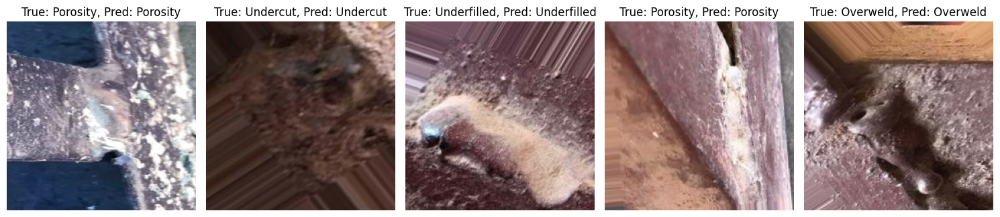

In [ ]:
plot_predictions(X_test, y_test, predicted_labels, categories, num_images=5)

## MobileNet

In [ ]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.layers import Dropout

In [ ]:

# Load the pre-trained MobileNet model, excluding the top layer
mobilenet_model = MobileNet(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add new layers for our custom classification task
x = mobilenet_model.output
x = GlobalAveragePooling2D()(x)  # Global average pooling instead of flattening
x= Dropout(0.5) (x)
x = Dense(1024, activation='relu')(x)  # Add a fully connected layer
predictions = Dense(len(categories), activation='softmax')(x)  # Output layer for 4 classes

# Define the final model
model = Model(inputs=mobilenet_model.input, outputs=predictions)

17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
# Freeze the layers of MobileNet to avoid retraining them
for layer in mobilenet_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1 (Conv2D)                       │ (None, 112, 112, 32)        │             864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_bn (BatchNormalization)        │ (None, 112, 112, 32)        │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_relu (ReLU)                    │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1 (DepthwiseConv2D)          │ (None, 112, 112, 32)        │             288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_bn (BatchNormalization)    │ (None, 112, 112, 32)        │             128 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_1_relu (ReLU)                │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1 (Conv2D)                   │ (None, 112, 112, 64)        │           2,048 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_bn (BatchNormalization)    │ (None, 112, 112, 64)        │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_1_relu (ReLU)                │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pad_2 (ZeroPadding2D)           │ (None, 113, 113, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2 (DepthwiseConv2D)          │ (None, 56, 56, 64)          │             576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_bn (BatchNormalization)    │ (None, 56, 56, 64)          │             256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_2_relu (ReLU)                │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2 (Conv2D)                   │ (None, 56, 56, 128)         │           8,192 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_bn (BatchNormalization)    │ (None, 56, 56, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_2_relu (ReLU)                │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3 (DepthwiseConv2D)          │ (None, 56, 56, 128)         │           1,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_bn (BatchNormalization)    │ (None, 56, 56, 128)         │             512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_dw_3_relu (ReLU)                │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv_pw_3 (Conv2D)                   │ (None, 56, 56, 128)         │          16,384 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 4,282,564 (16.34 MB)

 Trainable params: 1,053,700 (4.02 MB)

 Non-trainable params: 3,228,864 (12.32 MB)

In [ ]:
# Train the model
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=40, batch_size=32)


Epoch 1/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 18s 512ms/step - accuracy: 0.4824 - loss: 1.3008 - val_accuracy: 0.8765 - val_loss: 0.3214
Epoch 2/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - accuracy: 0.9139 - loss: 0.2949 - val_accuracy: 0.8765 - val_loss: 0.2530
Epoch 3/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - accuracy: 0.9440 - loss: 0.1969 - val_accuracy: 0.8827 - val_loss: 0.2377
Epoch 4/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 46ms/step - accuracy: 0.9260 - loss: 0.2090 - val_accuracy: 0.8951 - val_loss: 0.2336
Epoch 5/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - accuracy: 0.9450 - loss: 0.1702 - val_accuracy: 0.9012 - val_loss: 0.2219
Epoch 6/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 47ms/step - accuracy: 0.9440 - loss: 0.1426 - val_accuracy: 0.9074 - val_loss: 0.2168
Epoch 7/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 57ms/step - accuracy: 0.9422 - loss: 0.1612 - val_accuracy: 0.9136 - val_loss: 0.2230
Epoch 8/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - accuracy: 0.9535 - loss: 0.1258 - val_accuracy: 0.9198 -

### Accuracy

In [ ]:
# Evaluate the model on the test set
test_loss, test_acc = model.evaluate(X_test, y_test)
print(f"Test accuracy: {test_acc * 100:.2f}%")

3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 2s/step - accuracy: 0.9733 - loss: 0.0567
Test accuracy: 97.78%


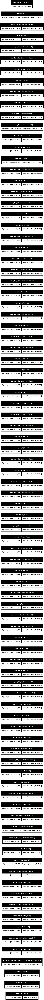

In [ ]:
plot_model(
    model,
    to_file='mobilemodel_architecture.png',  # Save the plot to a file
    show_shapes=True,                  # Display the shape of the layers
    show_layer_names=True,             # Display layer names
    dpi=96                             # Set the resolution of the image
)

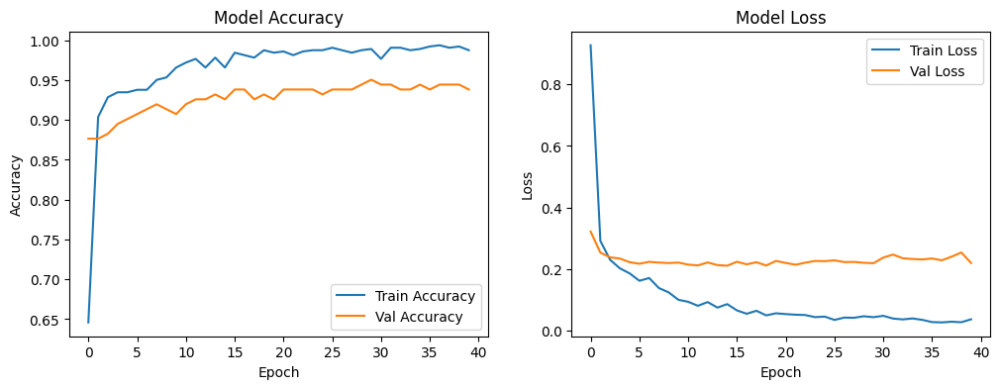

In [ ]:
# Plot training & validation accuracy and loss values
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')

plt.show()


In [ ]:
# Save the model after training
mobilenet_model.save('mobilenet_defect_classifier.h5')

### Predictions

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def predict_class(image_path, model, categories):
    """
    Predict the class of an input image using a pre-trained model.

    Args:
    - image_path (str): Path to the input image.
    - model (keras.Model): The trained model for classification.
    - categories (list): List of category names.

    Returns:
    - image: The processed image in the correct shape for display.
    - predicted_class: The name of the predicted category.
    """
    # Load the image
    image = cv2.imread(image_path)

    # Convert from BGR (OpenCV default) to RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Resize the image to the input size expected by the model (e.g., 224x224)
    resized_image = cv2.resize(image_rgb, (224, 224))

    # Preprocess the image for the model (normalization, reshaping, etc.)
    processed_image = resized_image / 255.0  # Normalize pixel values to [0, 1]
    processed_image = np.expand_dims(processed_image, axis=0)  # Add batch dimension

    # Use the model to predict the class probabilities
    predictions = model.predict(processed_image)

    # Get the index of the highest probability
    predicted_index = np.argmax(predictions, axis=1)[0]

    # Get the corresponding class name from the categories list
    predicted_class = categories[predicted_index]

    return image_rgb, predicted_class


In [ ]:
# Make predictions on the test set
predictions = model.predict(X_test)


1/3 ━━━━━━━━━━━━━━━━━━━━ 2s 1s/step

3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 941ms/step


Confusion Matrix:
[[25  0  0  0]
 [ 0 27  0  0]
 [ 0  1 18  0]
 [ 0  1  0 18]]


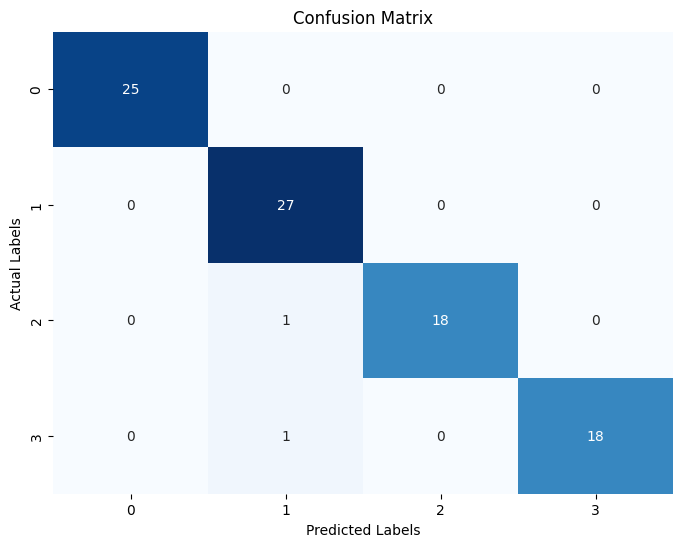

In [ ]:

predicted_labels = np.argmax(predictions, axis=1)

# 2. Convert y_test (one-hot encoded) to class indices
y_test_labels = np.argmax(y_test, axis=1)

# 3. Calculate the confusion matrix
confusion_matrix2 = tf.math.confusion_matrix(y_test_labels, predicted_labels)

# 4. Convert to numpy for easier handling
confusion_matrix2= confusion_matrix2.numpy()

# Print the confusion matrix as a raw tensor
print("Confusion Matrix:")
print(confusion_matrix2)
# Optionally, visualize the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix2, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.ylabel("Actual Labels")
plt.xlabel("Predicted Labels")
plt.show()

In [ ]:


# Predict class labels
y_pred = np.argmax(model.predict(X_test), axis=1)
y_true = np.argmax(y_test, axis=1)  # Assuming y_test is one-hot encoded

# Classification report
from sklearn.metrics import classification_report
report = classification_report(y_true, y_pred, target_names=categories)  # Replace 'class_names' with your class labels
print("Classification Report:")
print(report)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Classification Report:
              precision    recall  f1-score   support

    Overweld       1.00      1.00      1.00        25
    Undercut       0.93      1.00      0.96        27
 Underfilled       1.00      0.95      0.97        19
    Porosity       1.00      0.95      0.97        19

    accuracy                           0.98        90
   macro avg       0.98      0.97      0.98        90
weighted avg       0.98      0.98      0.98        90



In [ ]:
# Define the categories
categories = ['Overweld', 'Undercut', 'Underfilled', 'Porosity']

# Convert predictions to class labels
predicted_labels = np.argmax(predictions, axis=1)

# Map predicted labels to category names
predicted_categories = [categories[label] for label in predicted_labels]

# Print the predicted categories
print("Predicted categories:", predicted_categories)

Predicted categories: ['Porosity', 'Undercut', 'Underfilled', 'Porosity', 'Overweld', 'Undercut', 'Undercut', 'Undercut', 'Overweld', 'Overweld', 'Overweld', 'Porosity', 'Underfilled', 'Undercut', 'Undercut', 'Porosity', 'Underfilled', 'Underfilled', 'Porosity', 'Overweld', 'Undercut', 'Underfilled', 'Overweld', 'Underfilled', 'Underfilled', 'Underfilled', 'Overweld', 'Undercut', 'Overweld', 'Undercut', 'Underfilled', 'Overweld', 'Porosity', 'Undercut', 'Overweld', 'Underfilled', 'Overweld', 'Overweld', 'Porosity', 'Porosity', 'Overweld', 'Underfilled', 'Underfilled', 'Porosity', 'Undercut', 'Overweld', 'Overweld', 'Undercut', 'Overweld', 'Porosity', 'Undercut', 'Porosity', 'Undercut', 'Porosity', 'Undercut', 'Underfilled', 'Overweld', 'Undercut', 'Overweld', 'Overweld', 'Undercut', 'Undercut', 'Undercut', 'Overweld', 'Overweld', 'Porosity', 'Overweld', 'Undercut', 'Underfilled', 'Underfilled', 'Undercut', 'Undercut', 'Undercut', 'Porosity', 'Porosity', 'Underfilled', 'Porosity', 'Poro

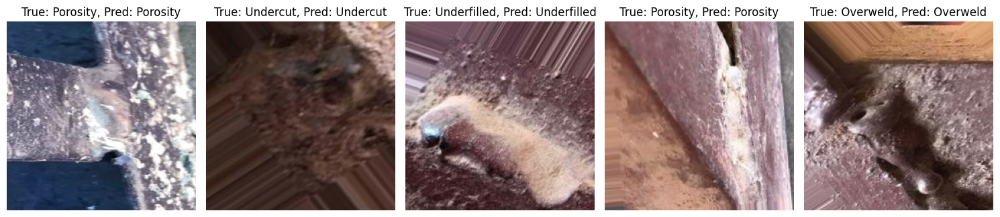

In [ ]:
# Plot some predictions
plot_predictions(X_test, y_test, predicted_labels, categories, num_images=5)

## Xception

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import Xception
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models

# Start with the base Xception model
base_model = Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model to retain pre-trained weights
for layer in base_model.layers:
    layer.trainable = False

# Add custom layers to the base model
x = layers.GlobalAveragePooling2D()(base_model.output)  # Flatten the feature map
x = layers.Dense(1024, activation='relu')(x)  # Add a fully connected layer
x = layers.Dropout(0.9)(x)  # Add dropout for regularization
output_layer = layers.Dense(4, activation='softmax')(x)  # Final output layer for 10 classes

# Create a new model combining the base model and custom head
model_xception = models.Model(inputs=base_model.input, outputs=output_layer)

# Print
model_xception.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 111, 111, 32)   │            864 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_bn           │ (None, 111, 111, 32)   │            128 │ block1_conv1[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_act          │ (None, 111, 111, 32)   │              0 │ block1_conv1_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2 (Conv2D)     │ (None, 109, 109, 64)   │         18,432 │ block1_conv1_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_bn           │ (None, 109, 109, 64)   │            256 │ block1_conv2[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_act          │ (None, 109, 109, 64)   │              0 │ block1_conv2_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1           │ (None, 109, 109, 128)  │          8,768 │ block1_conv2_act[0][0] │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1_bn        │ (None, 109, 109, 128)  │            512 │ block2_sepconv1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_act       │ (None, 109, 109, 128)  │              0 │ block2_sepconv1_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2           │ (None, 109, 109, 128)  │         17,536 │ block2_sepconv2_act[0… │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_bn        │ (None, 109, 109, 128)  │            512 │ block2_sepconv2[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 55, 55, 128)    │          8,192 │ block1_conv2_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_pool               │ (None, 55, 55, 128)    │              0 │ block2_sepconv2_bn[0]… │
│ (MaxPooling2D)            │                        │                │                        │
├──────────────────────

 Total params: 22,963,756 (87.60 MB)

 Trainable params: 2,102,276 (8.02 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

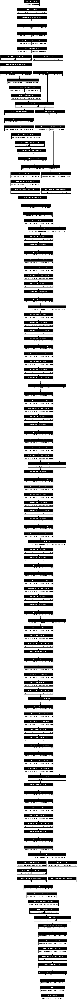

In [ ]:
plot_model(
    model_xception,
    to_file='Xception_architecture.png',  # Save the plot to a file
    show_shapes=True,                  # Display the shape of the layers
    show_layer_names=True,             # Display layer names
    dpi=96                             # Set the resolution of the image
)

In [ ]:
model_xception.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Train the model
history = model_xception.fit(
    X_train, y_train,  # Training data
    validation_data=(X_val, y_val),  # Validation data
    epochs=40,  # Number of epochs
    batch_size=32  # Batch size
)

Epoch 1/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 17s 518ms/step - accuracy: 0.4203 - loss: 1.4723 - val_accuracy: 0.8827 - val_loss: 0.3628
Epoch 2/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 11s 184ms/step - accuracy: 0.8685 - loss: 0.4219 - val_accuracy: 0.8951 - val_loss: 0.3020
Epoch 3/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - accuracy: 0.9007 - loss: 0.3344 - val_accuracy: 0.8889 - val_loss: 0.3017
Epoch 4/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - accuracy: 0.9176 - loss: 0.2631 - val_accuracy: 0.8889 - val_loss: 0.2972
Epoch 5/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 6s 189ms/step - accuracy: 0.9382 - loss: 0.2403 - val_accuracy: 0.9012 - val_loss: 0.2868
Epoch 6/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - accuracy: 0.9187 - loss: 0.2306 - val_accuracy: 0.9074 - val_loss: 0.3026
Epoch 7/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 6s 191ms/step - accuracy: 0.9261 - loss: 0.2145 - val_accuracy: 0.9198 - val_loss: 0.2538
Epoch 8/40
21/21 ━━━━━━━━━━━━━━━━━━━━ 4s 193ms/step - accuracy: 0.9364 - loss: 0.1922 - val_accuracy: 

### Accuracy

In [ ]:
# Now evaluate with the integer-encoded labels
test_loss, test_acc = model_xception.evaluate(X_test, y_test)
print(f"Test accuracy: {test_acc}")

3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 795ms/step - accuracy: 0.9733 - loss: 0.0571
Test accuracy: 0.9777777791023254


In [ ]:
model_xception.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 111, 111, 32)   │            864 │ input_layer_5[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_bn           │ (None, 111, 111, 32)   │            128 │ block1_conv1[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_act          │ (None, 111, 111, 32)   │              0 │ block1_conv1_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2 (Conv2D)     │ (None, 109, 109, 64)   │         18,432 │ block1_conv1_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_bn           │ (None, 109, 109, 64)   │            256 │ block1_conv2[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_act          │ (None, 109, 109, 64)   │              0 │ block1_conv2_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1           │ (None, 109, 109, 128)  │          8,768 │ block1_conv2_act[0][0] │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1_bn        │ (None, 109, 109, 128)  │            512 │ block2_sepconv1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_act       │ (None, 109, 109, 128)  │              0 │ block2_sepconv1_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2           │ (None, 109, 109, 128)  │         17,536 │ block2_sepconv2_act[0… │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_bn        │ (None, 109, 109, 128)  │            512 │ block2_sepconv2[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 55, 55, 128)    │          8,192 │ block1_conv2_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_pool               │ (None, 55, 55, 128)    │              0 │ block2_sepconv2_bn[0]… │
│ (MaxPooling2D)            │                        │                │                        │
├──────────────────────

 Total params: 27,168,310 (103.64 MB)

 Trainable params: 2,102,276 (8.02 MB)

 Non-trainable params: 20,861,480 (79.58 MB)

 Optimizer params: 4,204,554 (16.04 MB)

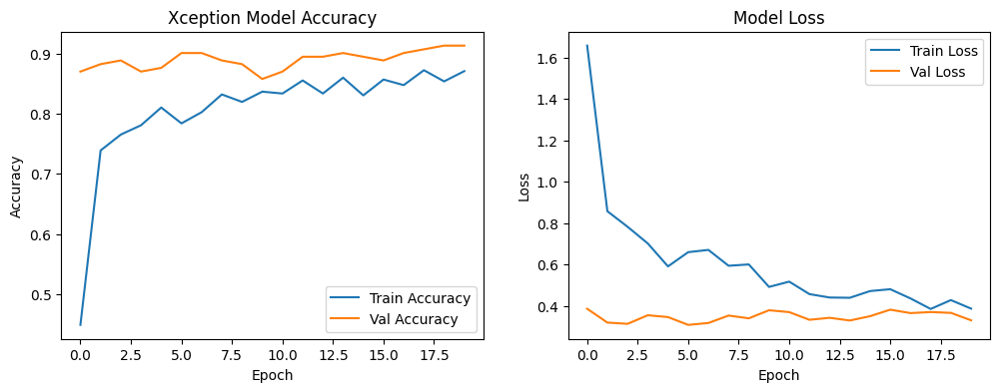

In [ ]:
# Plot training & validation accuracy and loss values
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Xception Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')

plt.show()

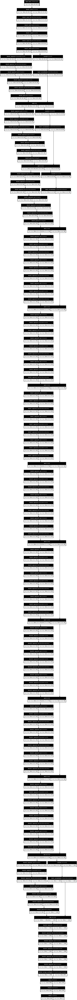

In [ ]:
plot_model(
    model_xception,
    to_file='xceptionmodel_architecture.png',  # Save the plot to a file
    show_shapes=True,                  # Display the shape of the layers
    show_layer_names=True,             # Display layer names
    dpi=96                             # Set the resolution of the image
)

In [ ]:
# Predict class labels
y_pred = np.argmax(model_xception.predict(X_test), axis=1)
y_true = np.argmax(y_test, axis=1)  # Assuming y_test is one-hot encoded

# Classification report
from sklearn.metrics import classification_report
report = classification_report(y_true, y_pred, target_names=categories)  # Replace 'class_names' with your class labels
print("Classification Report:")
print(report)

3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 1s/step
Classification Report:
              precision    recall  f1-score   support

    Overweld       1.00      1.00      1.00        25
    Undercut       0.96      0.96      0.96        27
 Underfilled       1.00      0.89      0.94        19
    Porosity       0.90      1.00      0.95        19

    accuracy                           0.97        90
   macro avg       0.97      0.96      0.96        90
weighted avg       0.97      0.97      0.97        90



In [ ]:
model.save('xception_defect_classifier1.h5')

### Prediction

In [ ]:
predictions= model_xception.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step


Confusion Matrix:
[[25  0  0  0]
 [ 0 26  0  1]
 [ 0  1 17  1]
 [ 0  0  0 19]]


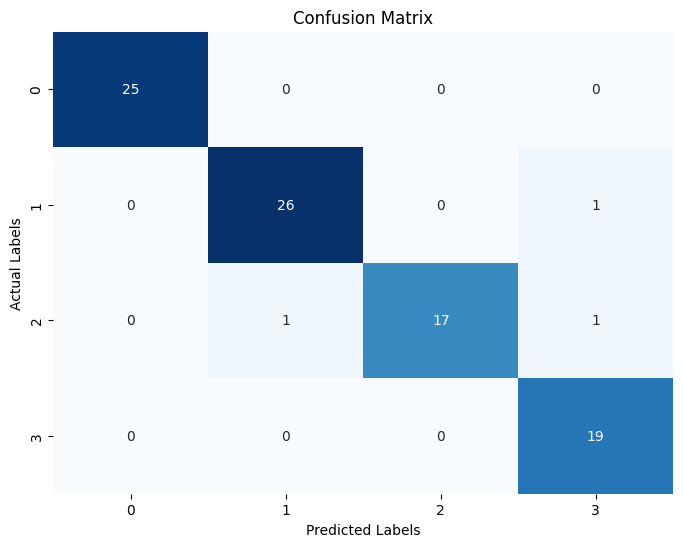

In [ ]:
predicted_labels = np.argmax(predictions, axis=1)

# 2. Convert y_test (one-hot encoded) to class indices
y_test_labels = np.argmax(y_test, axis=1)

# 3. Calculate the confusion matrix
confusion_matrix2 = tf.math.confusion_matrix(y_test_labels, predicted_labels)

# 4. Convert to numpy for easier handling
confusion_matrix2= confusion_matrix2.numpy()

# Print the confusion matrix as a raw tensor
print("Confusion Matrix:")
print(confusion_matrix2)
# Optionally, visualize the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix2, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.ylabel("Actual Labels")
plt.xlabel("Predicted Labels")
plt.show()

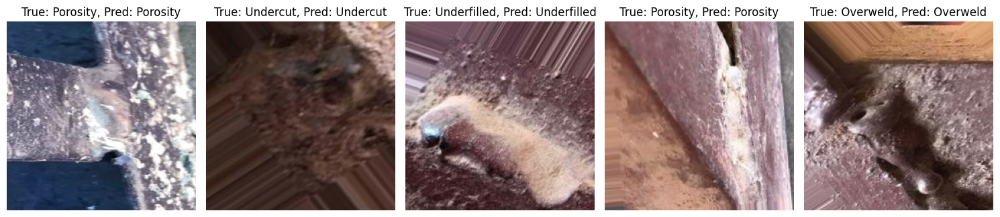

In [ ]:

plot_predictions(X_test, y_test, predicted_labels, categories, num_images=5)


## NASNet-Mobile Model

In [ ]:
from tensorflow.keras.applications import NASNetMobile
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model

# Load NASNetMobile with pretrained ImageNet weights, without the top layers
base_model = NASNetMobile(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the layers of the base model (NASNetMobile) to prevent them from training
for layer in base_model.layers:
    layer.trainable = False

# Add custom layers for classification
x = base_model.output  # Get the output of the base model
x = GlobalAveragePooling2D()(x)  # Add global average pooling to reduce dimensions
x= Dropout(0.8)(x)
x= Dropout(0.5)(x)
x = Dense(1024, activation='relu')(x)  # Add a fully connected layer with 1024 units and ReLU activation
predictions = Dense(len(categories), activation='softmax')(x)  # Output layer for the number of classes in your dataset

# Create the model
nasmodel = Model(inputs=base_model.input, outputs=predictions)
nasmodel.summary()

19993432/19993432 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Model: "functional_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv1 (Conv2D)       │ (None, 111, 111, 32)   │            864 │ input_layer_4[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn1                  │ (None, 111, 111, 32)   │            128 │ stem_conv1[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation (Activation)   │ (None, 111, 111, 32)   │              0 │ stem_bn1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reduction_conv_1_stem_1   │ (None, 111, 111, 11)   │            352 │ activation[0][0]       │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reduction_bn_1_stem_1     │ (None, 111, 111, 11)   │             44 │ reduction_conv_1_stem… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_1 (Activation) │ (None, 111, 111, 11)   │              0 │ reduction_bn_1_stem_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_3 (Activation) │ (None, 111, 111, 32)   │              0 │ stem_bn1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ separable_conv_1_pad_red… │ (None, 115, 115, 11)   │              0 │ activation_1[0][0]     │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ separable_conv_1_pad_red… │ (None, 117, 117, 32)   │              0 │ activation_3[0][0]     │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ separable_conv_1_reducti… │ (None, 56, 56, 11)     │            396 │ separable_conv_1_pad_… │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ separable_conv_1_reducti… │ (None, 56, 56, 11)     │          1,920 │ separable_conv_1_pad_… │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ separable_conv_1_bn_redu… │ (None, 56, 56, 11)     │             44 │ separable_conv_1_redu… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ separable_conv_1_bn_redu… │ (None, 56, 56, 11)     │             44 │ separable_conv_1_redu… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ activation_2 (Activat

 Total params: 5,356,184 (20.43 MB)

 Trainable params: 1,086,468 (4.14 MB)

 Non-trainable params: 4,269,716 (16.29 MB)

In [ ]:

# Compile the model
nasmodel.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Train the model
history = nasmodel.fit(
    X_train, y_train,  # Training data
    validation_data=(X_val, y_val),  # Validation data
    epochs=20,  # Number of epochs
    batch_size=32  # Batch size
)

Epoch 1/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 74s 2s/step - accuracy: 0.3295 - loss: 2.0311 - val_accuracy: 0.8704 - val_loss: 0.3863
Epoch 2/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 29s 73ms/step - accuracy: 0.7275 - loss: 0.8344 - val_accuracy: 0.8827 - val_loss: 0.3195
Epoch 3/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - accuracy: 0.7843 - loss: 0.6908 - val_accuracy: 0.8889 - val_loss: 0.3135
Epoch 4/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.7555 - loss: 0.7017 - val_accuracy: 0.8704 - val_loss: 0.3549
Epoch 5/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - accuracy: 0.7925 - loss: 0.7012 - val_accuracy: 0.8765 - val_loss: 0.3461
Epoch 6/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 3s 71ms/step - accuracy: 0.7677 - loss: 0.6890 - val_accuracy: 0.9012 - val_loss: 0.3083
Epoch 7/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.7813 - loss: 0.7878 - val_accuracy: 0.9012 - val_loss: 0.3176
Epoch 8/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - accuracy: 0.8189 - loss: 0.6012 - val_accuracy: 0.8889 - v

### Accuracy

In [ ]:
# Now evaluate with the integer-encoded labels
test_loss, test_acc = nasmodel.evaluate(X_test, y_test)
print(f"Test accuracy: {test_acc}")

3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 6s/step - accuracy: 0.9482 - loss: 0.2362
Test accuracy: 0.9666666388511658


In [ ]:
nasmodel.save('nasnet_defect_classifier1.h5')

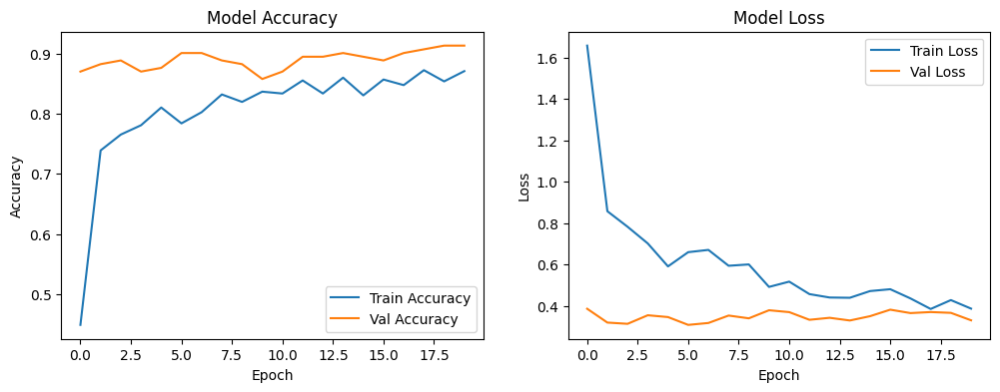

In [ ]:
# Plot training & validation accuracy and loss values
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')

plt.show()

### Prediction

In [ ]:

predictions = nasmodel.predict(X_test)

3/3 ━━━━━━━━━━━━━━━━━━━━ 26s 7s/step


Confusion Matrix:
[[25  0  0  0]
 [ 1 26  0  0]
 [ 0  0 18  1]
 [ 1  0  0 18]]


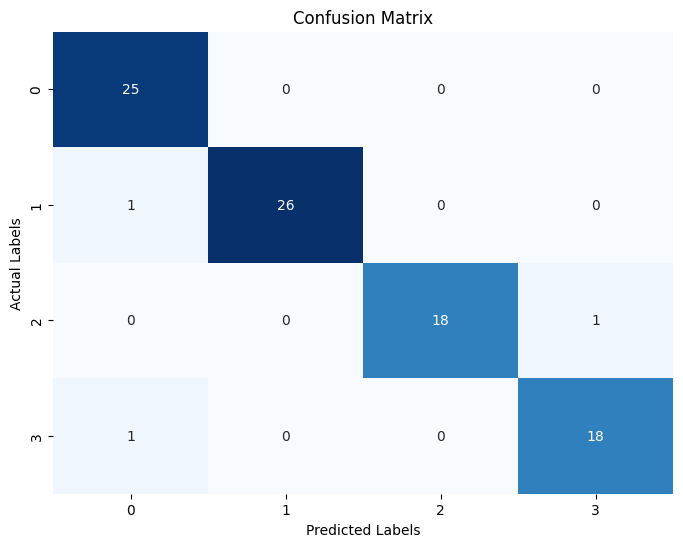

In [ ]:

predicted_labels = np.argmax(predictions, axis=1)

# 2. Convert y_test (one-hot encoded) to class indices
y_test_labels = np.argmax(y_test, axis=1)

# 3. Calculate the confusion matrix
confusion_matrix2 = tf.math.confusion_matrix(y_test_labels, predicted_labels)

# 4. Convert to numpy for easier handling
confusion_matrix2= confusion_matrix2.numpy()

# Print the confusion matrix as a raw tensor
print("Confusion Matrix:")
print(confusion_matrix2)
# Optionally, visualize the confusion matrix using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix2, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.ylabel("Actual Labels")
plt.xlabel("Predicted Labels")
plt.show()

In [ ]:

# Convert predictions to class labels
predicted_labels = np.argmax(predictions, axis=1)

# Map predicted labels to category names
predicted_categories = [categories[label] for label in predicted_labels]

# Print the predicted categories
print("Predicted categories:", predicted_categories)

Predicted categories: ['Overweld', 'Undercut', 'Underfilled', 'Porosity', 'Overweld', 'Undercut', 'Undercut', 'Undercut', 'Overweld', 'Overweld', 'Overweld', 'Porosity', 'Porosity', 'Overweld', 'Undercut', 'Porosity', 'Underfilled', 'Underfilled', 'Porosity', 'Overweld', 'Undercut', 'Underfilled', 'Overweld', 'Underfilled', 'Underfilled', 'Underfilled', 'Overweld', 'Porosity', 'Overweld', 'Undercut', 'Underfilled', 'Overweld', 'Porosity', 'Undercut', 'Overweld', 'Underfilled', 'Overweld', 'Overweld', 'Porosity', 'Porosity', 'Overweld', 'Underfilled', 'Underfilled', 'Porosity', 'Undercut', 'Overweld', 'Overweld', 'Undercut', 'Overweld', 'Porosity', 'Underfilled', 'Porosity', 'Undercut', 'Porosity', 'Undercut', 'Underfilled', 'Overweld', 'Undercut', 'Overweld', 'Overweld', 'Undercut', 'Undercut', 'Undercut', 'Overweld', 'Overweld', 'Porosity', 'Overweld', 'Undercut', 'Underfilled', 'Underfilled', 'Undercut', 'Undercut', 'Undercut', 'Porosity', 'Porosity', 'Underfilled', 'Porosity', 'Poro

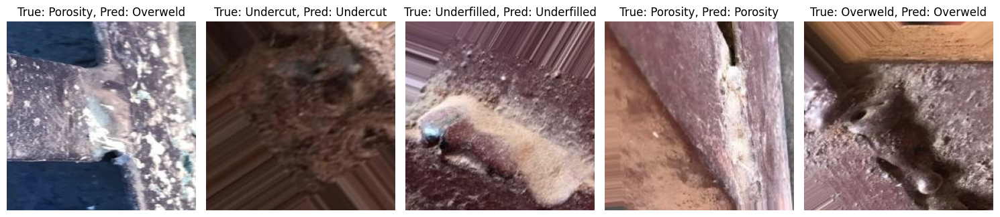

In [ ]:

# Plot some predictions
plot_predictions(X_test, y_test, predicted_labels, categories, num_images=5)

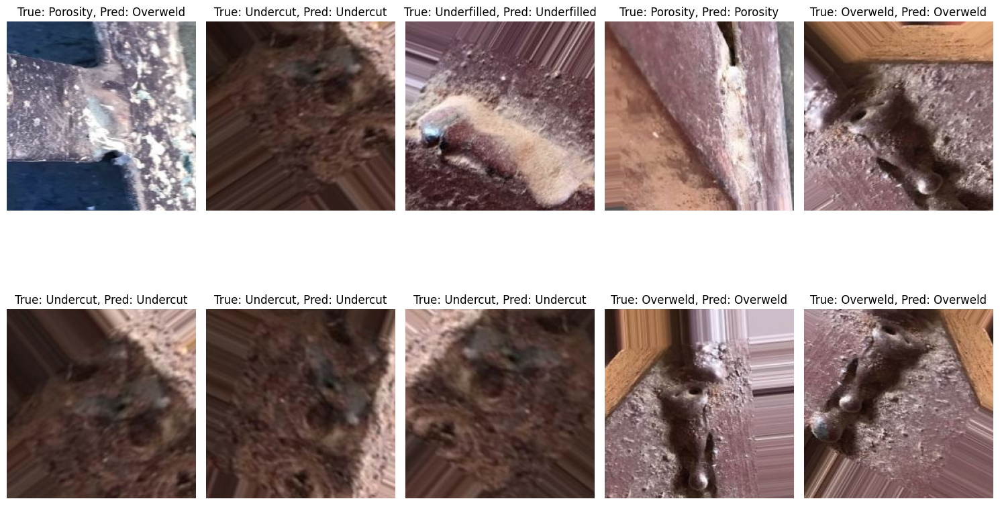

In [ ]:

# Plot some predictions
plot_predictions(X_test, y_test, predicted_labels, categories, num_images=10)
